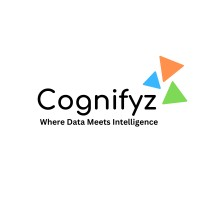

In [ ]:
from IPython.display import display, HTML

display(HTML("<h1 style='text-align: center;'>DATA ANALYSIS INTERNSHIP</h1>"))

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from wordcloud import wordcloud
sns.set(color_codes=True)
%matplotlib inline

In [ ]:
data =pd.read_csv("Dataset  (1).csv")
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
#checking for null values
data.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


In [ ]:
# checking for statical information
data.describe()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9542 entries, 0 to 9541
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has Table booking     9542 non-null   object 
 13  Has Online delivery   9542 non-null   object 
 14  Is delivering now     9542 non-null   object 
 15  Switch to order menu 

In [ ]:
# converting in boolean
data['Has Table booking'] = data['Has Table booking'].map({'Yes': True, 'No': False})
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': True, 'No': False})
data['Is delivering now'] = data['Is delivering now'].map({'Yes': True, 'No': False})
data['Switch to order menu'] = data['Switch to order menu'].map({'Yes': True, 'No': False})

# **Level 1**

## **TASK 1**

In [ ]:
top_cuisines = data['Cuisines'].value_counts().head(3)

# Convert to a DataFrame with columns 'Cuisines' and 'Count'
top_cuisines_df = top_cuisines.reset_index()
top_cuisines_df.columns = ['Cuisines', 'Count']

# Display the DataFrame
print(top_cuisines_df)

                Cuisines  Count
0           North Indian    936
1  North Indian, Chinese    511
2                Chinese    354


<ipython-input-42-765e977b503c>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(top_cuisines_df,x = 'Cuisines',y = 'Count' , palette = 'rocket')


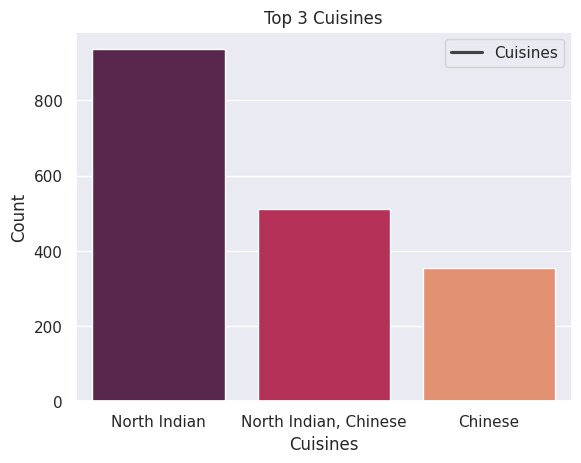

In [ ]:
sns.barplot(top_cuisines_df,x = 'Cuisines',y = 'Count' , palette = 'rocket')
plt.title('Top 3 Cuisines')
plt.legend(['Cuisines'])
plt.show()

In [ ]:
# Calculate Percentage of Restaurants Serving Each Cuisine

total_restaurants = len(data)
cuisine_percentage = (top_cuisines / total_restaurants) * 100
print("Top Cuisines:\n", top_cuisines)
print("Cuisine Percentages:\n", cuisine_percentage)

Top Cuisines:
 Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64
Cuisine Percentages:
 Cuisines
North Indian             9.809264
North Indian, Chinese    5.355271
Chinese                  3.709914
Name: count, dtype: float64


# **Task 2: City Analysis**

In [ ]:
most_restaurant_city =data['City'].value_counts().idxmax()
most_restaurant_city

'New Delhi'

In [ ]:
average_rating_by_city =data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
average_rating_by_city

,Aggregate rating
City,
Inner City,4.900000
Quezon City,4.800000
Makati City,4.650000
Pasig City,4.633333
Mandaluyong City,4.625000
...,...
New Delhi,2.438845
Montville,2.400000
Mc Millan,2.400000


In [ ]:
highest_average_rating_by_city =average_rating_by_city.idxmax()
highest_average_rating_by_city

'Inner City'

In [ ]:
print(f"City with most restaurant: {most_restaurant_city}")
print("Average Rating by City:\n", average_rating_by_city)
print(f"City with highest average rating: {highest_average_rating_by_city}")

City with most restaurant: New Delhi
Average Rating by City:
 City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 140, dtype: float64
City with highest average rating: Inner City


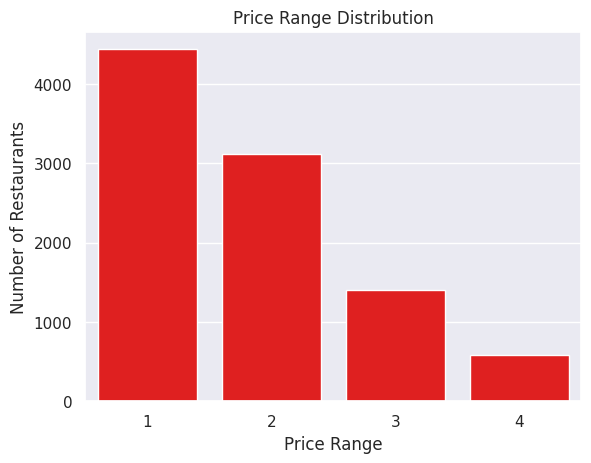

In [ ]:
### Task 3: Price Range Distribution
# Create Price Range Distribution Chart

price_distribution = data['Price range'].value_counts()
sns.barplot(x = price_distribution.index,y = price_distribution.values,color = 'red')
plt.title('Price Range Distribution')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()


In [ ]:
# Calculate Percentage by Price Range
price_percentage = (price_distribution / total_restaurants) * 100
print("Price Range Percentages:\n", price_percentage)

Price Range Percentages:
 Price range
1    46.510166
2    32.624188
3    14.724376
4     6.141270
Name: count, dtype: float64


In [ ]:
# Task 4: Online Delivery Comparison
# Online Delivery Analysis
online_delivery_counts = data['Has Online delivery'].value_counts(normalize=True) * 100

# Compare Average Ratings
avg_rating_online = data[data['Has Online delivery'] == True]['Aggregate rating'].mean()
avg_rating_no_online = data[data['Has Online delivery'] == False]['Aggregate rating'].mean()

print("Percentage of Restaurants Offering Online Delivery:\n", online_delivery_counts)
print(f"Average Rating (Online Delivery): {avg_rating_online}")
print(f"Average Rating (No Online Delivery): {avg_rating_no_online}")


Percentage of Restaurants Offering Online Delivery:
 Has Online delivery
False    74.313561
True     25.686439
Name: proportion, dtype: float64
Average Rating (Online Delivery): 3.2488372093023257
Average Rating (No Online Delivery): 2.4635171343957127


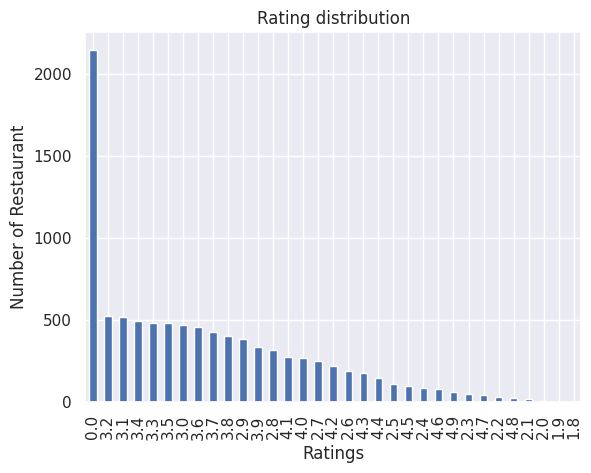

In [ ]:
# Level 2 Tasks

# Task 1: Restaurant Ratings Analysis
# Distribution of Aggregate Ratings

ratings_distribution = data['Aggregate rating'].value_counts()
ratings_distribution.plot(kind ='bar')
plt.title('Rating distribution')
plt.xlabel('Ratings')
plt.ylabel('Number of Restaurant')
plt.show()

In [ ]:
# Average Number of Votes
avg_votes = data['Votes'].mean()
print(f"Average Number of Votes: {avg_votes}")


Average Number of Votes: 156.7720603647034


In [ ]:
 # Most Common Cuisine Combinations
 cusine_combination = data['Cuisines'].value_counts().head(5)
print(" Most Common Cuisine Combinations:\n",cusine_combination)

 Most Common Cuisine Combinations:
 Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Fast Food                354
North Indian, Mughlai    334
Name: count, dtype: int64


In [ ]:


from folium.plugins import HeatMap
from IPython.display import display, IFrame


# Ensure the necessary columns are present
required_columns = ['Latitude', 'Longitude', 'Restaurant Name', 'City']
if not all(col in data.columns for col in required_columns):
    raise ValueError(f"Dataset must contain the following columns: {required_columns}")
data = data.dropna(subset=['Latitude', 'Longitude'])

# Create a folium map centered around the mean latitude and longitude
m = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],
               zoom_start=10,
               tiles="CartoDB positron")  # Tile layer for English place names

# Add markers for each restaurant
for _, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} ({row['City']})",
    ).add_to(m)

# Add shaded areas using a heatmap
heat_data = data[['Latitude', 'Longitude']].values.tolist()
HeatMap(heat_data, radius=15, blur=10, max_zoom=10).add_to(m)

# Save the map as an HTML file
map_filename = 'restaurant_map_with_shades.html'
m.save(map_filename)
print(f"Map saved as '{map_filename}'")

# Display the map inline in Jupyter Notebook
display(m)


Map saved as 'restaurant_map_with_shades.html'


In [ ]:
restaurant_chains = data["Restaurant Name"].value_counts().head(5)
print("top restaurant chain:\n",restaurant_chains)

top restaurant chain:
 Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Name: count, dtype: int64


# **Level 3**

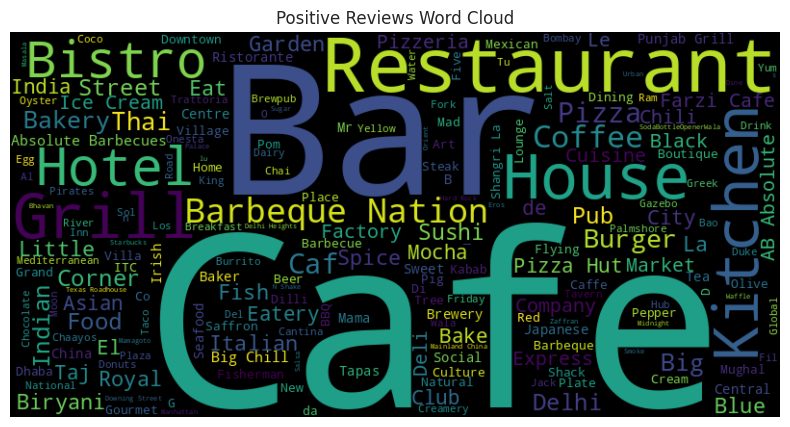

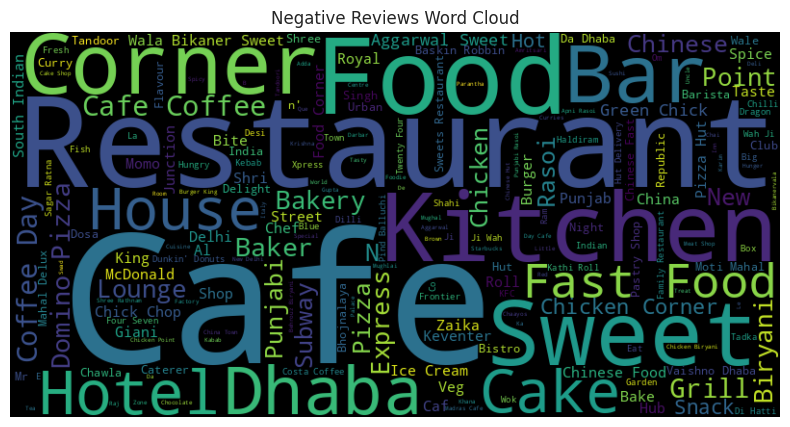

In [ ]:
# Placeholder for sentiment analysis since your dataset does not include review text

positive_reviews = data[data['Aggregate rating'] >= 4]['Restaurant Name'].str.cat(sep=' ')
negative_reviews = data[data['Aggregate rating'] < 4]['Restaurant Name'].str.cat(sep=' ')

# Create Word Clouds
positive_wc = WordCloud(width=800, height=400).generate(positive_reviews)
negative_wc = WordCloud(width=800, height=400).generate(negative_reviews)

plt.figure(figsize=(10, 5))
plt.imshow(positive_wc, interpolation='bilinear')
plt.title('Positive Reviews Word Cloud')
plt.axis('off')
plt.show()

plt.figure(figsize=(10, 5))
plt.imshow(negative_wc, interpolation='bilinear')
plt.title('Negative Reviews Word Cloud')
plt.axis('off')
plt.show()

In [ ]:
#Votes Analysis
most_votes = data.loc[data['Votes'].idxmax()]
least_votes = data.loc[data['Votes'].idxmin()]
print("Restaurant with Most Votes:\n", most_votes)
print("Restaurant with Least Votes:\n", least_votes)

Restaurant with Most Votes:
 Restaurant ID                                                       51705
Restaurant Name                                                      Toit
Country Code                                                            1
City                                                            Bangalore
Address                 298, Namma Metro Pillar 62, 100 Feet Road, Ind...
Locality                                                      Indiranagar
Locality Verbose                                   Indiranagar, Bangalore
Longitude                                                       77.640709
Latitude                                                        12.979166
Cuisines                                         Italian, American, Pizza
Average Cost for two                                                 2000
Currency                                               Indian Rupees(Rs.)
Has Table booking                                                   False
Has Onlin

In [ ]:
# Task 3: Price Range vs Online Delivery and Table Booking
# Analyze Price Range vs Services
service_comparison = data.groupby('Price range')[['Has Online delivery', 'Has Table booking']].mean() * 100
print(service_comparison)

print("Data analysis tasks completed.")

             Has Online delivery  Has Table booking
Price range                                        
1                      15.795403           0.022533
2                      41.310633           7.677482
3                      29.252669          45.836299
4                       9.044369          46.757679
Data analysis tasks completed.
